<a href="https://colab.research.google.com/github/Perkyson/assignment/blob/main/SRCNN01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras

In [ ]:
# Importing libraries
import sys
import keras
import cv2
import numpy
import matplotlib
import skimage
from keras.models import Sequential
from keras.layers import Conv2D
from keras.optimizers import Adam
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
import cv2
import numpy as np
import math
import os

In [ ]:
# Defining Image Quality Matric Functions
def psnr(target, ref):

    # assume RGB image
    target_data = target.astype(float)
    ref_data = ref.astype(float)

    diff = ref_data - target_data
    diff = diff.flatten('C')

    rmse = math.sqrt(np.mean(diff ** 2.))

    return 20 * math.log10(255. / rmse)

# define function for mean squared error (MSE)
def mse(target, ref):
    # the MSE between the two images is the sum of the squared difference between the two images
    err = np.sum((target.astype('float') - ref.astype('float')) ** 2)
    err /= float(target.shape[0] * target.shape[1])

    return err

# define function that combines all three image quality metrics
def compare_images(target, ref):
    scores = []
    scores.append(psnr(target, ref))
    scores.append(mse(target, ref))
    scores.append(ssim(target, ref, channel_axis=2))

    return scores

In [ ]:
# Preparing Images (degraded) by resizing
cwd = os.getcwd()  # Get the current working directory (cwd)
def prepare_images(path, factor):

    # loop through the files in the directory
    for file in os.listdir(path):
        try:
          # open the file
          img = cv2.imread(path + '/' + file)

          # find old and new image dimensions
          h, w, _ = img.shape
          new_height = int(h / factor)
          new_width = int(w / factor)

          # resize the image - down
          img = cv2.resize(img, (new_width, new_height), interpolation = cv2.INTER_LINEAR)

          # resize the image - up
          img = cv2.resize(img, (w, h), interpolation = cv2.INTER_LINEAR)

          # save the image
          print('Saving {}'.format(file))
          cv2.imwrite('images/{}'.format(file), img)
        except:
          print('ERROR for file-', file, '!')
          pass

prepare_images('source/', 2)

Saving coastguard.bmp
Saving barbara.bmp
Saving flowers.bmp
Saving lenna.bmp
Saving zebra.bmp
Saving foreman.bmp
Saving ppt3.bmp
Saving comic.bmp
Saving monarch.bmp
Saving baboon.bmp
Saving pepper.bmp
Saving face.bmp


In [ ]:
# Testing Quality difference between source and image (degraded)
for file in os.listdir('images/'):
    #try:
      # open target and reference images
      target = cv2.imread('images/{}'.format(file))
      ref = cv2.imread('source/{}'.format(file))

      # calculate score
      scores = compare_images(target, ref)

      # print all three scores with new line characters (\n)
      print('{}\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(file, scores[0], scores[1], scores[2]))
    #except:
     #pass

coastguard.bmp
PSNR: 27.161600663887082
MSE: 375.00887784090907
SSIM: 0.756950063354931

barbara.bmp
PSNR: 25.906629837568126
MSE: 500.65508535879627
SSIM: 0.8098632646406401

flowers.bmp
PSNR: 27.454504805386144
MSE: 350.55093922651935
SSIM: 0.8697286286974628

lenna.bmp
PSNR: 31.47349297867539
MSE: 138.94800567626953
SSIM: 0.8460989200521499

zebra.bmp
PSNR: 27.909840639329513
MSE: 315.6585459528818
SSIM: 0.8911656209329116

foreman.bmp
PSNR: 30.14456532664372
MSE: 188.6883483270202
SSIM: 0.933268417388899

ppt3.bmp
PSNR: 24.84926168950471
MSE: 638.6684263912582
SSIM: 0.9284023942315316

comic.bmp
PSNR: 23.799861502225532
MSE: 813.2338836565096
SSIM: 0.8347335416398209

monarch.bmp
PSNR: 30.196242365288896
MSE: 186.45643615722656
SSIM: 0.9439574293434104

baboon.bmp
PSNR: 22.157084083442548
MSE: 1187.1161333333334
SSIM: 0.629277587900277

pepper.bmp
PSNR: 29.88947161686106
MSE: 200.1033935546875
SSIM: 0.8357937568464359

face.bmp
PSNR: 30.99220650287191
MSE: 155.23189718546524
SSIM: 

In [ ]:
# Defining SRCNN Model
def model():

    # define model type
    SRCNN = Sequential()

    # add model layers
    SRCNN.add(Conv2D(filters=128, kernel_size = (9, 9), kernel_initializer='glorot_uniform',
                     activation='relu', padding='valid', use_bias=True, input_shape=(None, None, 1)))
    SRCNN.add(Conv2D(filters=64, kernel_size = (3, 3), kernel_initializer='glorot_uniform',
                     activation='relu', padding='same', use_bias=True))
    SRCNN.add(Conv2D(filters=1, kernel_size = (5, 5), kernel_initializer='glorot_uniform',
                     activation='linear', padding='valid', use_bias=True))

    # define optimizer
    # Changed 'lr' to 'learning_rate'
    adam = Adam(learning_rate=0.0003)

    # compile model
    SRCNN.compile(optimizer=adam, loss='mean_squared_error', metrics=['mean_squared_error'])

    return SRCNN

In [ ]:
# Create the model object by calling the model function
model_instance = model()
model_instance.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, None, None, 128)     │          10,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, None, None, 64)      │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, None, None, 1)       │           1,601 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 85,889 (335.50 KB)

 Trainable params: 85,889 (335.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Image Processing Functions
def modcrop(img, scale):
    tmpsz = img.shape
    sz = tmpsz[0:2]
    sz = sz - np.mod(sz, scale)
    img = img[0:sz[0], 1:sz[1]]
    return img


def shave(image, border):
    img = image[border: -border, border: -border]
    return img

In [ ]:
# define main prediction function

def predict(image_path):

    # load the srcnn model with weights
    srcnn = model()
    srcnn.load_weights('3051crop_weight_200.h5')

    # load the degraded and reference images
    path, file = os.path.split(image_path)
    degraded = cv2.imread(image_path)
    ref = cv2.imread('source/{}'.format(file))

    # Check if images loaded successfully
    if degraded is None or ref is None:
        print(f"Error loading images: degraded - {image_path}, ref - source/{file}")
        return None, None, None, None  # Return None values if images not loaded

    # preprocess the image with modcrop
    ref = modcrop(ref, 3)
    degraded = modcrop(degraded, 3)
    #Check if images are of sufficient size after modcrop
    if degraded.shape[0] < 7 or degraded.shape[1] < 7 or ref.shape[0] < 7 or ref.shape[1] < 7:
        print(f"Error: Images are too small after modcrop. degraded shape: {degraded.shape}, ref shape: {ref.shape}")
        return None, None, None, None

    # convert the image to YCrCb - (srcnn trained on Y channel)
    temp = cv2.cvtColor(degraded, cv2.COLOR_BGR2YCrCb)

    # create image slice and normalize
    Y = numpy.zeros((1, temp.shape[0], temp.shape[1], 1), dtype=float)
    Y[0, :, :, 0] = temp[:, :, 0].astype(float) / 255

    # perform super-resolution with srcnn
    pre = srcnn.predict(Y, batch_size=1)

    # post-process output
    pre *= 255
    pre[pre[:] > 255] = 255
    pre[pre[:] < 0] = 0
    pre = pre.astype(np.uint8)

    # copy Y channel back to image and convert to BGR
    temp = shave(temp, 6)
    temp[:, :, 0] = pre[0, :, :, 0]
    output = cv2.cvtColor(temp, cv2.COLOR_YCrCb2BGR)

    # remove border from reference and degraged image
    ref = shave(ref.astype(np.uint8), 6)
    degraded = shave(degraded.astype(np.uint8), 6)

    # image quality calculations
    scores = []
    scores.append(compare_images(degraded, ref))
    scores.append(compare_images(output, ref))

    # return images and scores
    return ref, degraded, output, scores

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step
Degraded Image: 
PSNR: 27.248686459559124
MSE: 367.56400047398984
SSIN: 0.8690622024599293

Reconstructed Image: 
PSNR: 29.660197682816325
HSE: 210.95112572579689
SSIN: 0.8989099632535621



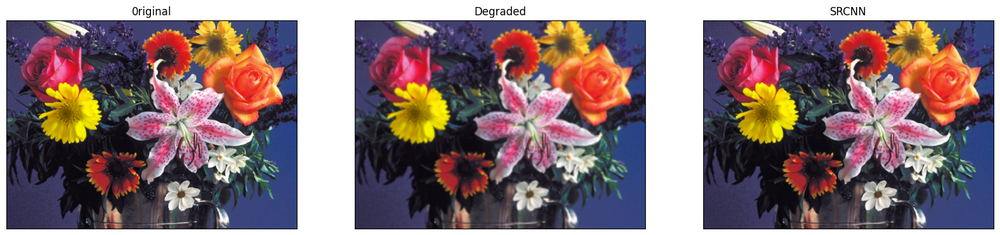

In [ ]:
ref, degraded, output, scores = predict('/content/images/flowers.bmp')
#ref, degraded, output, scores = predict('/content/images/bird.png')

# print all scores for all images
print('Degraded Image: \nPSNR: {}\nMSE: {}\nSSIN: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
print('Reconstructed Image: \nPSNR: {}\nHSE: {}\nSSIN: {}\n'.format(scores[1][0], scores[1][1], scores[1][2]))
# display images as subplots
fig, axs = plt.subplots(1,3, figsize =(20,8))
axs[0].imshow(cv2.cvtColor(ref,cv2.COLOR_BGR2RGB))
axs[0].set_title('0riginal')
axs[1].imshow(cv2.cvtColor(degraded,cv2.COLOR_BGR2RGB))
axs[1].set_title('Degraded')
axs[2].imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
axs[2].set_title('SRCNN')
#remove the x and y tick marks
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step
Processing: coastguard.bmp
Degraded Image: 
PSNR: 27.37
MSE: 357.53
SSIM: 0.7528

Reconstructed Image: 
PSNR: 28.67
MSE: 264.72
SSIM: 0.8292



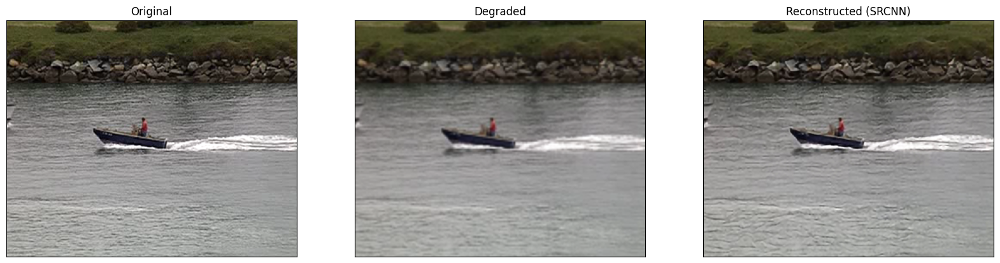

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Processing: barbara.bmp
Degraded Image: 
PSNR: 25.89
MSE: 502.71
SSIM: 0.8087

Reconstructed Image: 
PSNR: 26.58
MSE: 429.16
SSIM: 0.8550



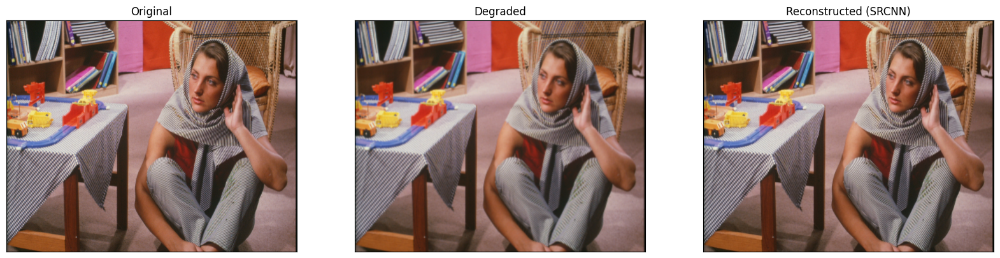

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
Processing: flowers.bmp
Degraded Image: 
PSNR: 27.25
MSE: 367.56
SSIM: 0.8691

Reconstructed Image: 
PSNR: 29.66
MSE: 210.95
SSIM: 0.8989



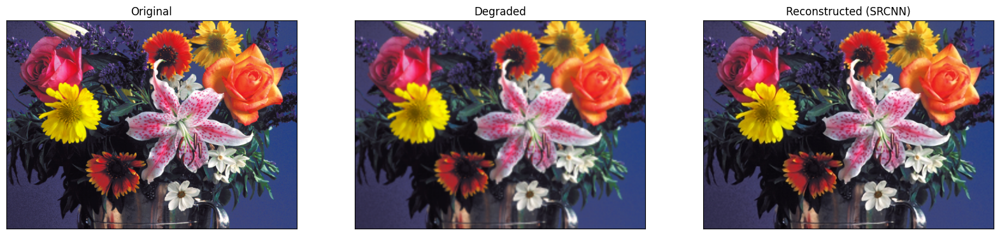

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
Processing: lenna.bmp
Degraded Image: 
PSNR: 31.36
MSE: 142.67
SSIM: 0.8459

Reconstructed Image: 
PSNR: 33.11
MSE: 95.36
SSIM: 0.8682



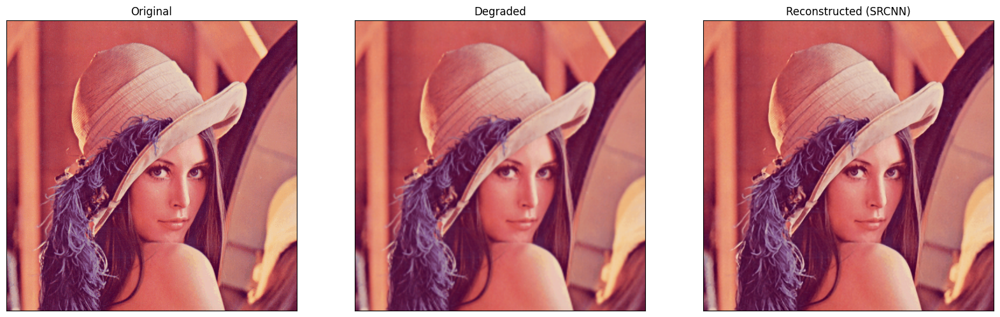

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step
Processing: zebra.bmp
Degraded Image: 
PSNR: 27.78
MSE: 325.50
SSIM: 0.8923

Reconstructed Image: 
PSNR: 30.41
MSE: 177.66
SSIM: 0.9329



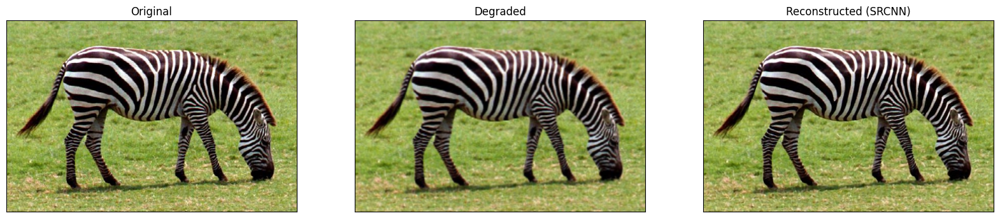

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
Processing: foreman.bmp
Degraded Image: 
PSNR: 32.04
MSE: 121.82
SSIM: 0.9384

Reconstructed Image: 
PSNR: 36.15
MSE: 47.37
SSIM: 0.9625



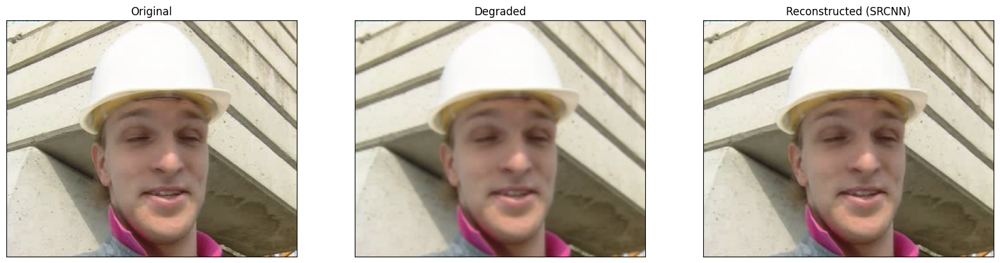

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Processing: ppt3.bmp
Degraded Image: 
PSNR: 24.65
MSE: 668.19
SSIM: 0.9252

Reconstructed Image: 
PSNR: 27.14
MSE: 376.61
SSIM: 0.9476



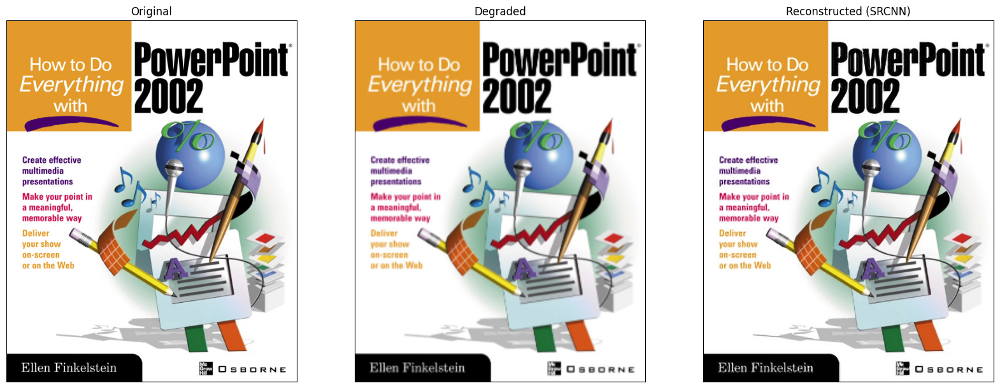

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
Processing: comic.bmp
Degraded Image: 
PSNR: 23.64
MSE: 844.54
SSIM: 0.8296

Reconstructed Image: 
PSNR: 25.88
MSE: 503.45
SSIM: 0.8995



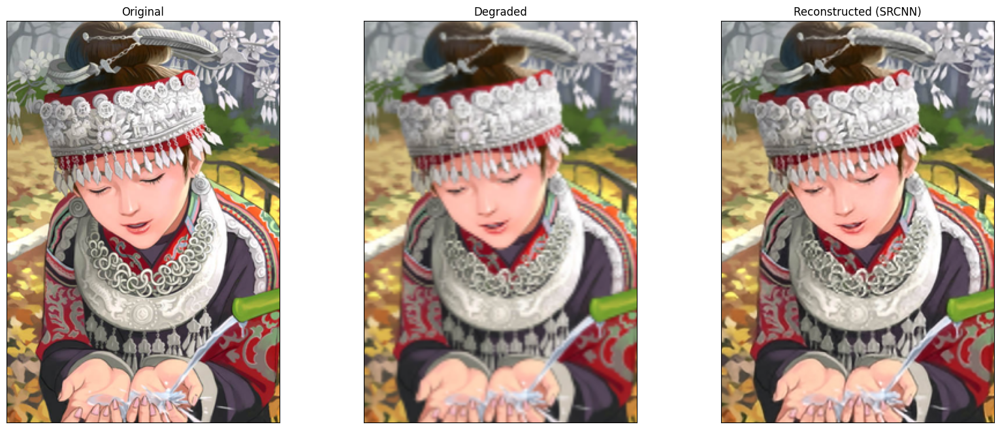

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Processing: monarch.bmp
Degraded Image: 
PSNR: 30.04
MSE: 193.10
SSIM: 0.9433

Reconstructed Image: 
PSNR: 35.13
MSE: 59.83
SSIM: 0.9659



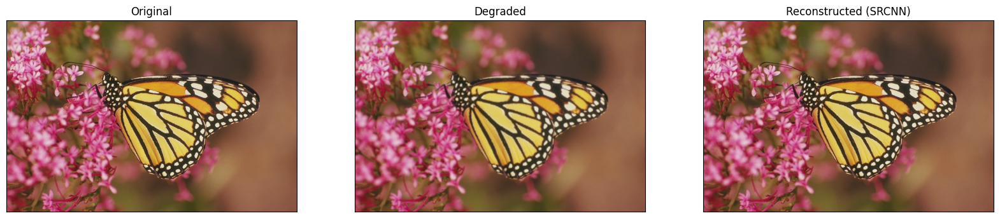

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Processing: baboon.bmp
Degraded Image: 
PSNR: 22.29
MSE: 1152.63
SSIM: 0.6327

Reconstructed Image: 
PSNR: 23.04
MSE: 969.70
SSIM: 0.7091



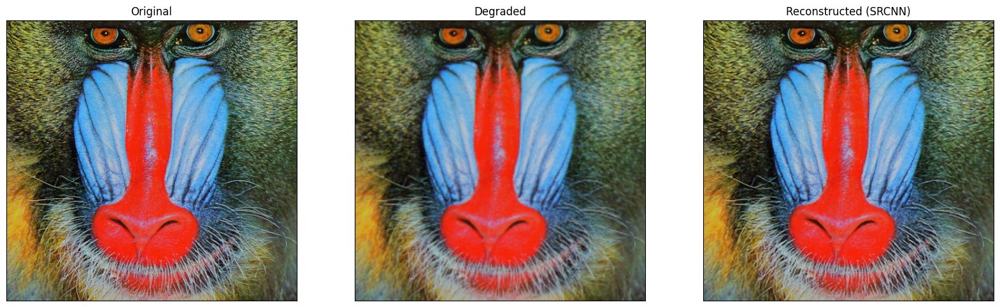

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Processing: pepper.bmp
Degraded Image: 
PSNR: 31.45
MSE: 139.79
SSIM: 0.8377

Reconstructed Image: 
PSNR: 32.78
MSE: 102.77
SSIM: 0.8496



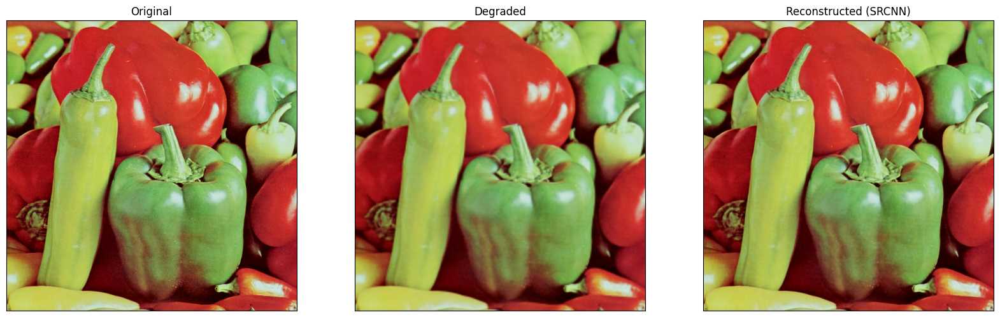

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
Processing: face.bmp
Degraded Image: 
PSNR: 30.88
MSE: 159.21
SSIM: 0.8004

Reconstructed Image: 
PSNR: 31.64
MSE: 133.68
SSIM: 0.8283



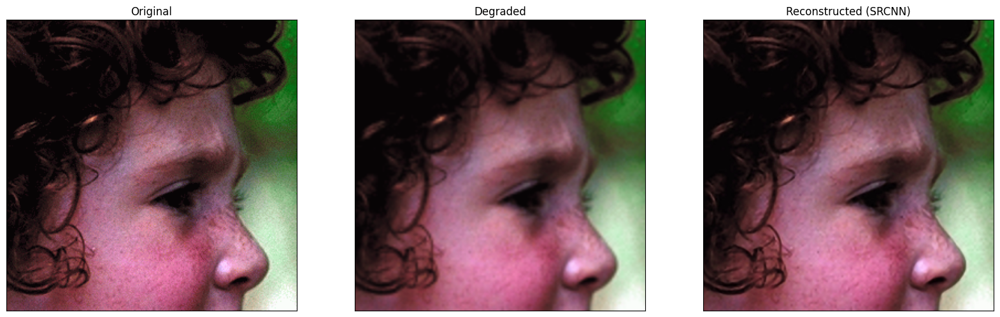

In [ ]:
# Directory containing images
image_dir = "/content/images/"

# Get list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))]

# Process each image
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Predict results
    ref, degraded, output, scores = predict(image_path)

    # Print scores
    print(f'Processing: {image_file}')
    print('Degraded Image: \nPSNR: {:.2f}\nMSE: {:.2f}\nSSIM: {:.4f}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
    print('Reconstructed Image: \nPSNR: {:.2f}\nMSE: {:.2f}\nSSIM: {:.4f}\n'.format(scores[1][0], scores[1][1], scores[1][2]))

    # Display images as subplots
    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original')
    axs[1].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Degraded')
    axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Reconstructed (SRCNN)')

    # Remove x and y tick marks
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()  # Show the plot for each image
